🔍 YOLOv8 Object Detector
1. Rileva oggetti in un'immagine
2. Rileva oggetti in tempo reale (webcam Colab)
3. Rileva oggetti in un video
Scegli un'opzione (1/2/3): 1
Inserisci il percorso dell'immagine: /content/bus.jpg

0: 640x480 3 persons, 1 bus, 210.8ms
Speed: 8.8ms preprocess, 210.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


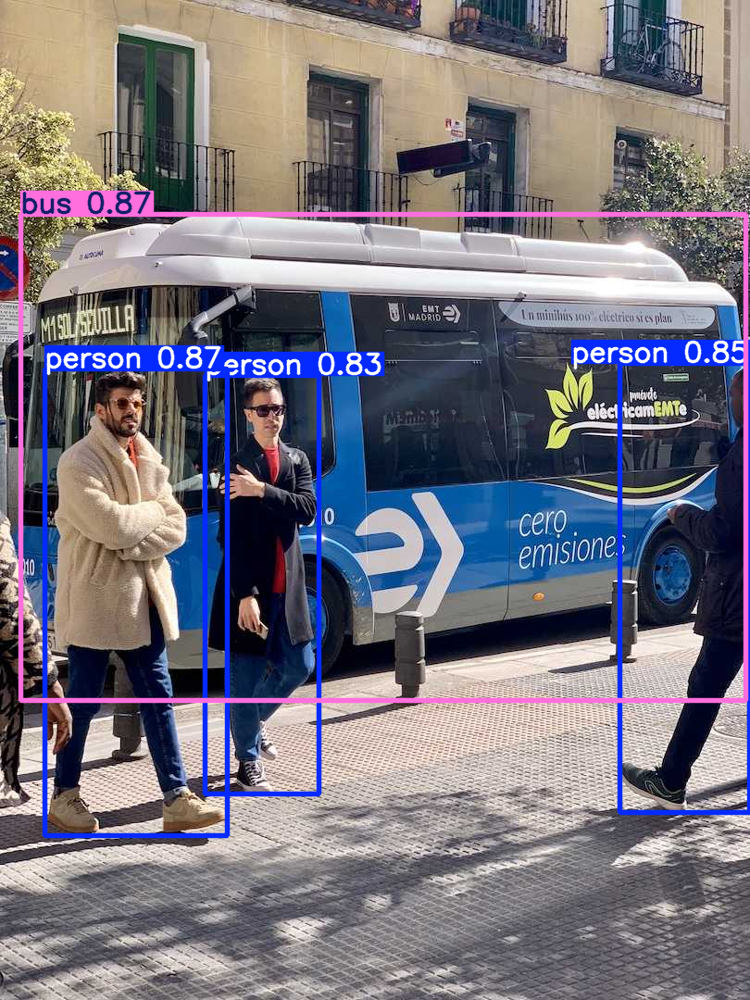

In [14]:
import cv2
from ultralytics import YOLO
import numpy as np
from google.colab.patches import cv2_imshow
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# ----------------------------------------------------------
# 1. Caricamento del modello (scegli una opzione)
# ----------------------------------------------------------
model = YOLO("yolov8n.pt")  # Modello pre-addestrato COCO
# model = YOLO("path/to/your_custom_model.pt")  # Per modelli personalizzati

# ----------------------------------------------------------
# Funzione per acquisire un frame dalla webcam di Colab
# ----------------------------------------------------------
def take_photo(quality=0.8):
    js = Javascript('''
        async function takePhoto(quality) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture Frame';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            return new Promise((resolve) => {
                capture.onclick = () => {
                    const canvas = document.createElement('canvas');
                    canvas.width = video.videoWidth;
                    canvas.height = video.videoHeight;
                    canvas.getContext('2d').drawImage(video, 0, 0);
                    stream.getVideoTracks()[0].stop();
                    div.remove();
                    resolve(canvas.toDataURL('image/jpeg', quality));
                };
            });
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    nparr = np.frombuffer(binary, np.uint8)
    img_np = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
    return img_np

# ----------------------------------------------------------
# 2. Funzione per il rilevamento su immagine
# ----------------------------------------------------------
def detect_image(image_path, conf_threshold=0.5):
    # Carica l'immagine
    image = cv2.imread(image_path)
    if image is None:
        print("Errore: Immagine non trovata!")
        return

    # Esegui detection
    results = model(image, conf=conf_threshold)

    # Visualizza i risultati
    for r in results:
        im_array = r.plot()  # Disegna bounding box e labels
        cv2_imshow(im_array)  # Usa cv2.imshow() se non sei su Colab

# ----------------------------------------------------------
# 3. Funzione per il rilevamento in tempo reale (video/fotocamera) per Colab
# ----------------------------------------------------------
def detect_realtime_colab(conf_threshold=0.5):
    print("Premi 'Capture Frame' per acquisire un frame e processarlo.")
    print("Per interrompere, ferma l'esecuzione della cella (Ctrl+M, I o il pulsante stop)")

    while True:
        try:
            frame = take_photo()
            if frame is None:
                print("Nessun frame acquisito.")
                continue

            # Esegui detection
            results = model(frame, conf=conf_threshold, verbose=False)

            # Visualizza i risultati
            for r in results:
                frame_with_detections = r.plot()
                cv2_imshow(frame_with_detections)

        except Exception as e:
            print(f"Errore durante l'acquisizione o l'elaborazione del frame: {e}")
            break # Esci dal loop in caso di errore (es. interruzione utente)

# ----------------------------------------------------------
# 4. Menu interattivo
# ----------------------------------------------------------
def main():
    print("🔍 YOLOv8 Object Detector")
    print("1. Rileva oggetti in un'immagine")
    print("2. Rileva oggetti in tempo reale (webcam Colab)") # Modificato
    print("3. Rileva oggetti in un video")
    choice = input("Scegli un'opzione (1/2/3): ")

    if choice == "1":
        image_path = input("Inserisci il percorso dell'immagine: ")
        detect_image(image_path)
    elif choice == "2":
        detect_realtime_colab() # Chiama la funzione per Colab
    elif choice == "3":
        video_path = input("Inserisci il percorso del video: ")
        # Per i video in Colab, dovresti prima caricare il video nel tuo ambiente Colab
        # e poi usare cv2.VideoCapture(video_path) come faresti localmente,
        # ma la visualizzazione sarà comunque tramite cv2_imshow.
        # Mantengo la funzione originale per semplicità, ma tieni presente questa differenza.
        detect_realtime_from_video(video_path) # Ho rinominato la funzione per chiarezza
    else:
        print("Scelta non valida!")

# ----------------------------------------------------------
# 3. Funzione per il rilevamento in tempo reale (video) - Modificata per Colab
# ----------------------------------------------------------
def detect_realtime_from_video(source, conf_threshold=0.5):
    cap = cv2.VideoCapture(source)
    if not cap.isOpened():
        print(f"Errore: Video non disponibile o percorso errato: {source}")
        return

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Esegui detection
        results = model(frame, conf=conf_threshold, verbose=False)

        # Visualizza i risultati
        for r in results:
            frame_with_detections = r.plot()
            cv2_imshow(frame_with_detections) # Usa cv2_imshow per Colab

        # In Colab non avrai un loop di eventi per cv2.waitKey,
        # quindi la "pausa" tra i frame è implicita nella visualizzazione
        # di cv2_imshow. Per interrompere, devi interrompere l'esecuzione della cella.

    cap.release()
    print("Riproduzione video terminata.")

if __name__ == "__main__":
    main()

<IPython.core.display.Javascript object>

🔍 YOLOv8 Object Detector per Google Colab
1. Rileva oggetti in un'immagine
2. Rileva oggetti dalla webcam (simulazione live)
3. Rileva oggetti in un video (da file caricato)
Scegli un'opzione (1/2/3): 2

Avvio del rilevamento dalla webcam (Colab)...
Premi il pulsante 'Interrompi esecuzione' (quadrato nero) nella cella per fermare.


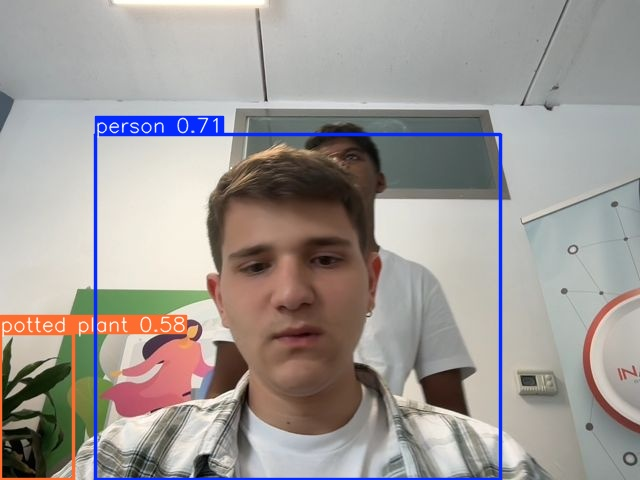

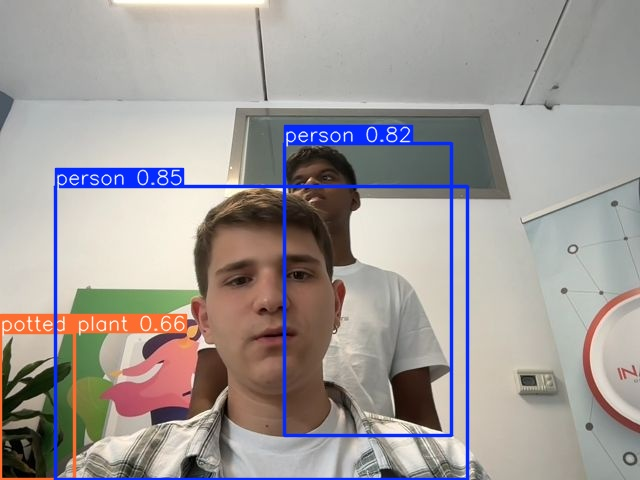

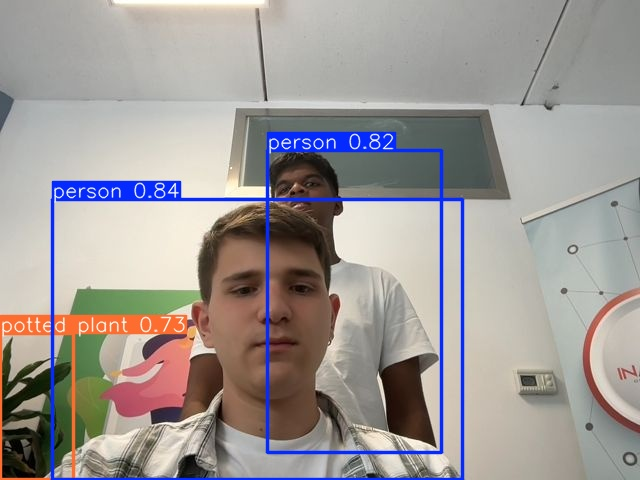

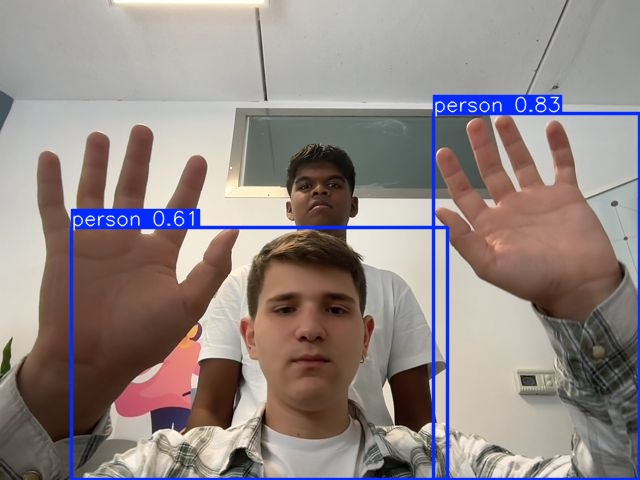

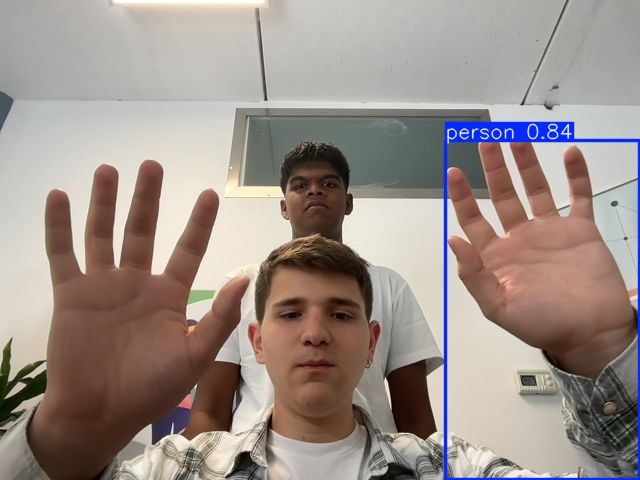

...

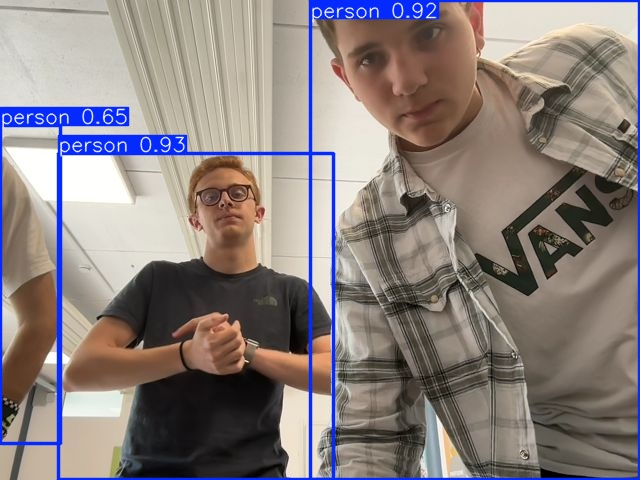

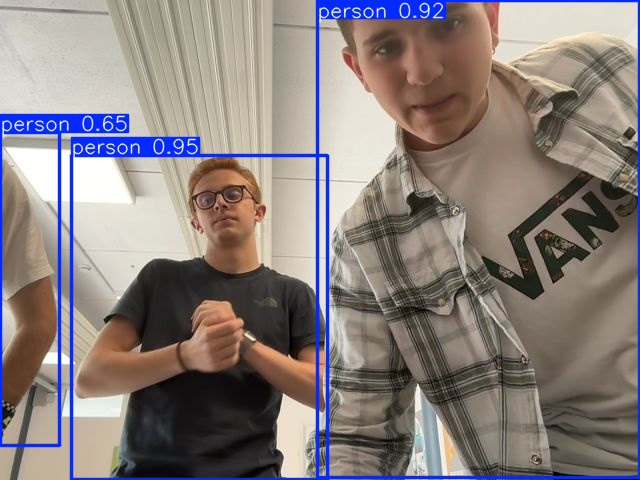

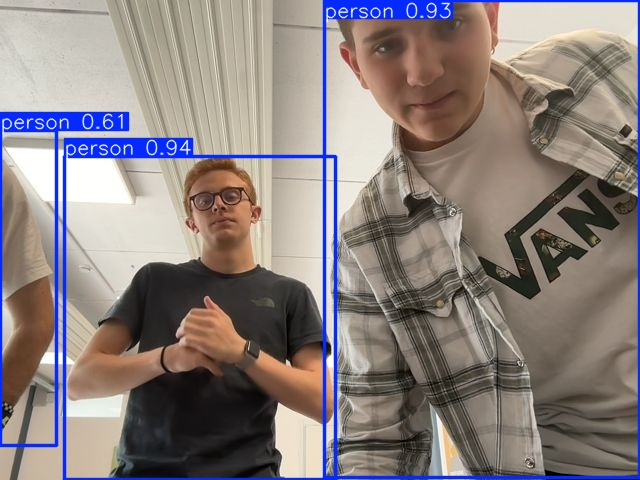

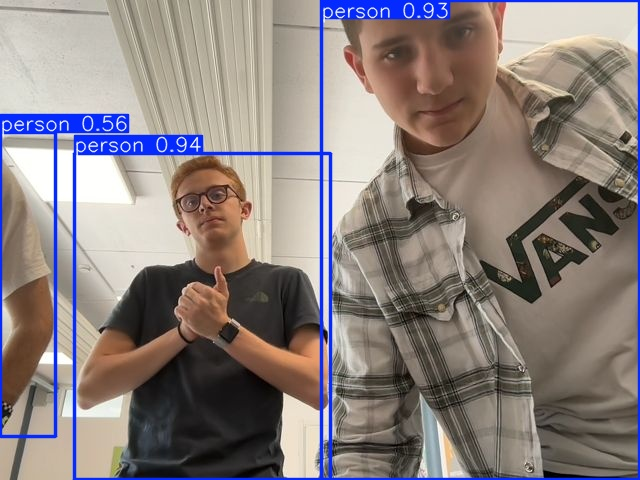

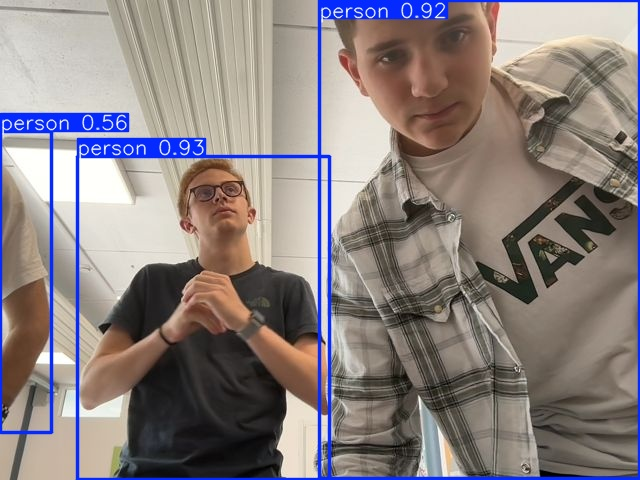


Arresto dello stream della webcam...


KeyboardInterrupt: 

In [16]:
import cv2
from ultralytics import YOLO
import numpy as np
from google.colab.patches import cv2_imshow # Solo per Colab
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode
import time

# ----------------------------------------------------------
# Funzione JavaScript per acquisire un frame dalla webcam di Colab
# migliorata per l'acquisizione continua
# Questo blocco JavaScript deve essere eseguito una sola volta
# prima di chiamare start_stream, stop_stream o capture_frame.
# ----------------------------------------------------------
js_setup = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var img;

    async function startVideoStream() {
        if (div !== null) {
            // If already started, do nothing
            return 'started';
        }
        div = document.createElement('div');
        document.body.appendChild(div);

        video = document.createElement('video');
        video.style.display = 'block';
        div.appendChild(video);

        stream = await navigator.mediaDevices.getUserMedia({video: true});
        video.srcObject = stream;
        await video.play();

        // Resize the output to fit the video element.
        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        captureCanvas = document.createElement('canvas');
        captureCanvas.width = video.videoWidth;
        captureCanvas.height = video.videoHeight;
        img = document.createElement('img');
        img.src = '';
        div.appendChild(img);

        return 'ready';
    }

    function stopVideoStream() {
        if (stream) {
            stream.getVideoTracks()[0].stop();
            if (video) video.remove(); // Aggiunto controllo per video
            if (div) div.remove();     // Aggiunto controllo per div
            div = null; // Reset div
            stream = null; // Reset stream
            video = null; // Reset video
            captureCanvas = null; // Reset captureCanvas
            img = null; // Reset img
        }
        return 'stopped';
    }

    function captureFrame(quality) {
        if (!video || !captureCanvas) {
            return null;
        }
        captureCanvas.getContext('2d').drawImage(video, 0, 0);
        return captureCanvas.toDataURL('image/jpeg', quality);
    }
''')

# Esegui lo script JavaScript all'inizio
display(js_setup)


def start_stream():
    # Aggiunto un piccolo ritardo per dare tempo allo script JS di avviarsi
    time.sleep(0.5)
    return eval_js('startVideoStream()')

def stop_stream():
    return eval_js('stopVideoStream()')

def capture_frame(quality=0.8):
    data = eval_js('captureFrame({})'.format(quality))
    if data:
        binary = b64decode(data.split(',')[1])
        nparr = np.frombuffer(binary, np.uint8)
        img_np = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
        return img_np
    return None

# ----------------------------------------------------------
# 1. Caricamento del modello (scegli una opzione)
# ----------------------------------------------------------
# NOTA: Il modello verrà caricato nella funzione main() ora
# model = YOLO("yolov8n.pt")

# ----------------------------------------------------------
# 2. Funzione per il rilevamento su immagine (invariata)
# ----------------------------------------------------------
def detect_image(model, image_path, conf_threshold=0.5):
    """Rileva oggetti in un'immagine"""
    image = cv2.imread(image_path)
    if image is None:
        print("Errore: Immagine non trovata!")
        return

    results = model(image, conf=conf_threshold)
    for r in results:
        image = r.plot()  # Disegna bounding box

    cv2_imshow(image) # Usa cv2_imshow per Colab
    # In Colab non c'è cv2.waitKey(0) e cv2.destroyAllWindows() per le immagini fisse
    # la visualizzazione è gestita dalla cella.

# ----------------------------------------------------------
# 3. Funzione per il rilevamento in "tempo reale" (webcam Colab)
# ----------------------------------------------------------
def detect_realtime_colab(model, conf_threshold=0.5, delay=0.05): # Aggiunto 'delay' per controllare la frequenza
    print("\nAvvio del rilevamento dalla webcam (Colab)...")
    print("Premi il pulsante 'Interrompi esecuzione' (quadrato nero) nella cella per fermare.")

    # Avvia lo stream JavaScript
    # start_stream() viene chiamata qui per avviare la webcam
    status = start_stream()
    # Non è necessario controllare lo status qui, se fallisce, l'eccezione
    # in eval_js verrà catturata dal blocco try...except

    try:
        # Aggiunto un breve ritardo dopo l'avvio dello stream per garantire che la webcam sia pronta
        time.sleep(1)

        while True:
            frame = capture_frame()
            if frame is None:
                # Questo può accadere se lo stream non è ancora pronto o si è interrotto
                # print("Nessun frame acquisito, riprovo...")
                time.sleep(delay) # Attendi prima di riprovare
                continue

            # Esegui detection
            results = model(frame, conf=conf_threshold, verbose=False)

            # Visualizza i risultati
            for r in results:
                frame_with_detections = r.plot()
                # Utilizza display(Image(...)) invece di cv2_imshow per aggiornamenti più fluidi
                _, buffer = cv2.imencode('.jpg', frame_with_detections)
                img_bytes = buffer.tobytes()
                display(Image(data=img_bytes))

            # Piccolo ritardo per evitare di sovraccaricare il sistema e il browser
            # Puoi aumentare o diminuire questo valore per influenzare la fluidità
            time.sleep(delay)

    except Exception as e:
        print(f"Errore durante l'acquisizione o l'elaborazione del frame: {e}")
    finally:
        print("\nArresto dello stream della webcam...")
        stop_stream() # Assicurati di fermare lo stream JavaScript

# ----------------------------------------------------------
# 4. Funzione per il rilevamento in tempo reale (video su Colab)
# ----------------------------------------------------------
def detect_realtime_from_video(model, source, conf_threshold=0.5):
    cap = cv2.VideoCapture(source)
    if not cap.isOpened():
        print(f"Errore: Video non disponibile o percorso errato: {source}")
        print("Assicurati di aver caricato il video nel tuo ambiente Colab!")
        return

    print(f"\nAvvio del rilevamento sul video: {source}...")
    print("Per interrompere, ferma l'esecuzione della cella (quadrato nero).")

    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                print("Fine del video o errore di lettura.")
                break # Esci dal loop se il video è finito o c'è un errore

            # Esegui detection
            results = model(frame, conf=conf_threshold, verbose=False)

            # Visualizza i risultati
            for r in results:
                frame_with_detections = r.plot()
                # Anche qui usiamo display(Image) per coerenza e potenzialmente migliore visualizzazione
                _, buffer = cv2.imencode('.jpg', frame_with_detections)
                img_bytes = buffer.tobytes()
                display(Image(data=img_bytes))


            # Un piccolo ritardo per controllare la velocità di riproduzione
            # Aggiustalo in base alla velocità del tuo video e alla potenza della GPU
            time.sleep(0.01) # Ad esempio, circa 10ms per frame

    except Exception as e:
        print(f"Errore durante l'elaborazione del video: {e}")
    finally:
        cap.release()
        print("Riproduzione video terminata.")


# ----------------------------------------------------------
# 5. Menu interattivo
# ----------------------------------------------------------
def main():
    print("🔍 YOLOv8 Object Detector per Google Colab")
    print("1. Rileva oggetti in un'immagine")
    print("2. Rileva oggetti dalla webcam (simulazione live)")
    print("3. Rileva oggetti in un video (da file caricato)")
    choice = input("Scegli un'opzione (1/2/3): ")

    # Carica il modello una sola volta
    model = YOLO("yolov8n.pt") # Sostituisci con il tuo modello se necessario

    if choice == "1":
        image_path = input("Inserisci il percorso dell'immagine (es. /content/my_image.jpg): ")
        detect_image(model, image_path)
    elif choice == "2":
        detect_realtime_colab(model)
    elif choice == "3":
        video_path = input("Inserisci il percorso del video (es. /content/my_video.mp4): ")
        detect_realtime_from_video(model, video_path)
    else:
        print("Scelta non valida!")

if __name__ == "__main__":
    main()